### Planet: Understanding the Amazon from Space

#### Description

Every minute, the world loses an area of forest the size of 48 football fields. And deforestation in the Amazon Basin accounts for the largest share, contributing to reduced biodiversity, habitat loss, climate change, and other devastating effects. But better data about the location of deforestation and human encroachment on forests can help governments and local stakeholders respond more quickly and effectively.

Planet, designer and builder of the world’s largest constellation of Earth-imaging satellites, will soon be collecting daily imagery of the entire land surface of the earth at 3-5 meter resolution. While considerable research has been devoted to tracking changes in forests, it typically depends on coarse-resolution imagery from Landsat (30 meter pixels) or MODIS (250 meter pixels). This limits its effectiveness in areas where small-scale deforestation or forest degradation dominate.

Furthermore, these existing methods generally cannot differentiate between human causes of forest loss and natural causes. Higher resolution imagery has already been shown to be exceptionally good at this, but robust methods have not yet been developed for Planet imagery.

In this competition, Planet and its Brazilian partner SCCON are challenging Kagglers to label satellite image chips with atmospheric conditions and various classes of land cover/land use. Resulting algorithms will help the global community better understand where, how, and why deforestation happens all over the world - and ultimately how to respond.

To dig into/explore more Planet data, sign up for a free account.

And if you're interested in building applications on Planet data, check out our Application Developer Program.

### First comes the part where we spilt the training data in a way that we can use Keras

In [1]:
%cd /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/
%pwd

/Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet


u'/Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet'

In [2]:
%ls

Planet Kaggle competition.ipynb  vgg16.py*
_data/                           vgg16.pyc
models/                          vgg16bn.py*
utils.py*                        vgg16bn.pyc
utils.pyc


In [3]:
# create some very important directories
import os, sys
current_dir = os.getcwd()
HOME_DIR = current_dir
DATA_DIR = current_dir+'/_data'
DATA_SAMPLE_DIR = DATA_DIR+'/sample'
TRINING_DATA_DIR = DATA_DIR+'/train'
TEST_DATA_DIR = DATA_DIR+'/test'
JPG_EXTENSION=".jpg"
TAG_LIST=[]

In [4]:
#import helper functions from fast.ai
from utils import *
from vgg16 import Vgg16

Using Theano backend.


In [4]:
#Instantiate plotting tool
#In Jupyter notebooks, you will need to run this command before doing any plotting
%matplotlib inline

In [6]:
%cd $DATA_DIR
#%mkdir valid
#%mkdir results

/Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data


In [7]:
%pwd

u'/Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data'

In [8]:
# create sample dir to mimic the data directory

%mkdir -p sample/train
%mkdir -p sample/test
%mkdir -p sample/valid
%mkdir -p sample/results
%mkdir -p test/unknown

In [9]:
%cd $DATA_DIR/train

/Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train


In [10]:
%pwd

u'/Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train'

##### Preparing the data for keras

Keras is very picky about how it wants its data. The training set we have so far is just a folder with pictures and a CSV file that specifically mentions what tags they have associated with it. 


We need to separate all the images with a certain tag in a folder so that Keras can learn to recognize that tag. Bare in mind a picture can have one or more tags so spliting in this way will increase thesize of the training set.

### The TAG_LIST

agriculture   
artisinal_mine   
bare_ground   
blooming   
blow_down   
clear   
cloudy   
conventional_mine   
cultivation   
habitation   
haze   
partly_cloudy   
primary   
road   
selective_logging   
slash_burn   
water   


In [5]:
# if by any chance we lose the list of tags, this is how we get it from
# the csv 

#import csv

# -----
#csvFile = open(DATA_DIR+'/train.csv', 'rb')
#trainingSet = csv.reader(csvFile)
    
#isHeader = True
    
#for row in trainingSet:
#    if isHeader:
#        isHeader=False
#        continue
#    for tag in row[1].split():
#        if TAG_LIST.count(tag) == 0:
#            TAG_LIST.append(tag)
# -------

TAG_LIST = ['agriculture', 'artisinal_mine', 'bare_ground', 'blooming', 'blow_down', 'clear', 'cloudy', 'conventional_mine', 'cultivation', 'habitation', 'haze', 'partly_cloudy', 'primary', 'road', 'selective_logging', 'slash_burn', 'water']


In [11]:
# for every row in the trian.csv
#   for every entry in the second column
#     create a directory if it doesn't exist
#        copy the file with name from first column to the appropriate folder

# import lib for manipulating train.csv
import csv

# load train.csv to memory
csvfile = open(DATA_DIR+'/train.csv', 'rb')
trainset = csv.reader(csvfile)

# import lib for copying files
from shutil import copyfile

# train.csv has a header, make sure and skip that
isHeader=True

#count=0
# for every row in the dataset
for row in trainset:
    if isHeader:
        isHeader=False
        continue
    
    # for testing purposes so we don't do a lot of operations
    # on the first go
    #count +=1
    #if count > 5:
    #    break
    
    # make sure we have the right data
    #print row[0]+' - '+row[1]
    
    # for every tag associated with the image
    for tag in row[1].split():
        if TAG_LIST.count(tag) == 0:
            TAG_LIST.append(tag)
        if not os.path.exists(tag):
            os.makedirs(tag)
        file_to_copy = TRINING_DATA_DIR+'/'+row[0]+JPG_EXTENSION
        destination_file = TRINING_DATA_DIR+'/'+tag+'/'+row[0]+JPG_EXTENSION
        print("Copy " + file_to_copy + " to " + destination_file)
        #copyfile(file_to_copy, destination_file)

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_0.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/haze/train_0.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_0.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_0.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_1.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/agriculture/train_1.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_1.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_1.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_1.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_1.jpg
C

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_420.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/bare_ground/train_420.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_420.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_420.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_420.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_420.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_420.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/road/train_420.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_421.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/agr

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_923.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/water/train_923.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_924.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/blow_down/train_924.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_924.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_924.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_924.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_924.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_925.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/agri

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_1336.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/cloudy/train_1336.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_1337.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_1337.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_1337.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_1337.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_1337.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/selective_logging/train_1337.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_1337.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/plane

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_1749.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/partly_cloudy/train_1749.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_1749.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_1749.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_1749.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/road/train_1749.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_1750.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_1750.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_1750.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_dat

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_2169.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_2169.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_2170.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/artisinal_mine/train_2170.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_2170.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_2170.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_2170.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/water/train_2170.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_2171.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_d

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_2583.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/water/train_2583.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_2584.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/agriculture/train_2584.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_2584.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_2584.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_2584.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_2584.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_2584.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_2983.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_2983.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_2983.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_2983.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_2984.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_2984.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_2984.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_2984.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_2985.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/tra

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_3493.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/road/train_3493.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_3493.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/water/train_3493.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_3494.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/agriculture/train_3494.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_3494.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_3494.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_3494.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/tr

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_3896.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/cultivation/train_3896.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_3896.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/habitation/train_3896.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_3896.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_3896.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_3896.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/road/train_3896.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_3897.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_4382.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/road/train_4382.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_4382.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/water/train_4382.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_4383.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_4383.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_4383.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_4383.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_4384.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_6763.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_6763.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_6763.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_6763.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_6764.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/agriculture/train_6764.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_6764.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_6764.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_6764.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_7187.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/cultivation/train_7187.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_7187.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_7187.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_7187.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/water/train_7187.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_7188.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/agriculture/train_7188.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_7188.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_7730.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/cultivation/train_7730.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_7730.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_7730.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_7730.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/selective_logging/train_7730.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_7731.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/haze/train_7731.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_7731.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/p

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_8274.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/road/train_8274.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_8275.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_8275.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_8275.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_8275.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_8276.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/agriculture/train_8276.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_8276.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_8689.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/road/train_8689.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_8690.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_8690.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_8690.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_8690.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_8690.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/road/train_8690.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_8691.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/c

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_9077.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_9077.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_9077.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/cultivation/train_9077.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_9077.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_9077.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_9077.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/selective_logging/train_9077.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_9078.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_9495.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/water/train_9495.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_9496.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/haze/train_9496.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_9496.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_9496.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_9497.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_9497.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_9497.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_9881.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_9881.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_9882.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/bare_ground/train_9882.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_9882.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_9882.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_9882.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_9882.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_9882.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_da

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_10280.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/water/train_10280.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_10281.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/haze/train_10281.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_10281.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_10281.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_10281.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/water/train_10281.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_10282.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_da

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_10697.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/partly_cloudy/train_10697.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_10697.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_10697.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_10698.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/cloudy/train_10698.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_10698.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_10698.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_10699.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspac

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_11087.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/haze/train_11087.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_11087.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_11087.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_11088.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_11088.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_11088.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_11088.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_11089.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_14323.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/partly_cloudy/train_14323.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_14323.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_14323.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_14324.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_14324.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_14324.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_14324.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_14324.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_15026.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_15026.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_15026.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_15026.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_15027.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_15027.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_15027.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_15027.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_15028.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_15649.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_15649.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_15649.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_15649.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_15649.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/water/train_15649.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_15650.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_15650.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_15650.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_d

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_16180.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_16180.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_16181.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/agriculture/train_16181.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_16181.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_16181.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_16181.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/cultivation/train_16181.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_16181.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspa

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_16610.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_16610.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_16610.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/water/train_16610.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_16611.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/partly_cloudy/train_16611.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_16611.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_16611.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_16612.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_17018.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_17018.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_17018.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_17018.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_17019.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/partly_cloudy/train_17019.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_17019.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_17019.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_17020.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_17440.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_17440.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_17440.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/habitation/train_17440.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_17440.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_17440.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_17440.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/road/train_17440.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_17440.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/plane

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_17843.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/agriculture/train_17843.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_17843.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_17843.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_17843.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_17843.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_17844.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/agriculture/train_17844.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_17844.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspa

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_18254.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/water/train_18254.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_18255.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/agriculture/train_18255.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_18255.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/habitation/train_18255.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_18255.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/partly_cloudy/train_18255.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_18255.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/wo

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_18783.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/habitation/train_18783.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_18783.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_18783.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_18783.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/road/train_18783.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_18784.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_18784.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_18784.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/plane

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_22740.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_22740.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_22741.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/cloudy/train_22741.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_22742.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_22742.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_22742.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/habitation/train_22742.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_22742.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/pla

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_23534.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/partly_cloudy/train_23534.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_23534.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_23534.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_23535.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_23535.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_23535.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_23535.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_23536.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_24095.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_24095.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_24096.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_24096.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_24096.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_24096.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_24097.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/agriculture/train_24097.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_24097.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/p

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_24623.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/agriculture/train_24623.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_24623.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/haze/train_24623.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_24623.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_24623.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_24623.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/water/train_24623.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_24624.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/plan

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_25061.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/agriculture/train_25061.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_25061.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_25061.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_25061.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_25061.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_25061.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/road/train_25061.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_25062.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/plan

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_25432.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_25432.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_25433.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_25433.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_25433.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/habitation/train_25433.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_25433.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_25433.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_25433.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/pl

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_25802.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/cultivation/train_25802.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_25802.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/partly_cloudy/train_25802.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_25802.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_25802.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_25802.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/water/train_25802.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_25803.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/works

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_26174.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_26174.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_26174.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/road/train_26174.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_26175.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/partly_cloudy/train_26175.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_26175.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_26175.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_26176.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_26679.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_26679.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_26679.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_26679.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_26680.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_26680.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_26680.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_26680.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_26681.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_29879.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/water/train_29879.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_29880.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_29880.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_29880.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_29880.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_29881.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/cloudy/train_29881.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_29882.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_30319.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/cultivation/train_30319.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_30319.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_30319.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_30320.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_30320.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_30320.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_30320.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_30321.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/p

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_30839.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_30839.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_30839.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/water/train_30839.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_30840.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_30840.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_30840.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_30840.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_30841.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_31407.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/agriculture/train_31407.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_31407.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_31407.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_31407.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/cultivation/train_31407.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_31407.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/habitation/train_31407.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_31407.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/work

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_31953.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/artisinal_mine/train_31953.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_31953.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_31953.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_31953.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_31953.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_31953.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/water/train_31953.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_31954.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_32441.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_32441.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_32442.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_32442.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_32442.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_32442.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_32443.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_32443.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_32443.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_32889.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/water/train_32889.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_32890.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/agriculture/train_32890.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_32890.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_32890.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_32890.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_32890.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_32891.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/pla

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_33339.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/habitation/train_33339.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_33339.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/partly_cloudy/train_33339.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_33339.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_33339.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_33339.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/road/train_33339.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_33340.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspa

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_33781.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/agriculture/train_33781.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_33781.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_33781.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_33781.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/habitation/train_33781.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_33781.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_33781.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_33781.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspac

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_34192.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/agriculture/train_34192.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_34192.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_34192.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_34192.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_34192.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_34192.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/water/train_34192.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_34193.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/pla

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_37184.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/partly_cloudy/train_37184.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_37184.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_37184.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_37185.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_37185.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_37185.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_37185.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_37186.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_37836.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/road/train_37836.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_37837.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_37837.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_37837.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_37837.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_37838.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/partly_cloudy/train_37838.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_37838.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/pl

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_38416.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/water/train_38416.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_38417.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_38417.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_38417.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_38417.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_38417.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/water/train_38417.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_38418.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_d

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_38909.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/haze/train_38909.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_38909.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_38909.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_38910.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_38910.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_38910.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_38910.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_38911.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_39410.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_39410.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_39411.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/partly_cloudy/train_39411.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_39411.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/water/train_39411.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_39412.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_39412.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_39412.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/p

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_39810.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/agriculture/train_39810.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_39810.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/cloudy/train_39810.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_39810.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_39810.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_39811.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/agriculture/train_39811.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_39811.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/worksp

Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_40258.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/partly_cloudy/train_40258.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_40258.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/primary/train_40258.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_40259.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/agriculture/train_40259.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_40259.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear/train_40259.jpg
Copy /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/train_40259.jpg to /Users/bogdanmel/Documents/training/fast-course-ai/works

In [6]:
print TAG_LIST
print len(TAG_LIST)

['agriculture', 'artisinal_mine', 'bare_ground', 'blooming', 'blow_down', 'clear', 'cloudy', 'conventional_mine', 'cultivation', 'habitation', 'haze', 'partly_cloudy', 'primary', 'road', 'selective_logging', 'slash_burn', 'water']
17


In [20]:
%cd $DATA_DIR/train
%ls

/Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train
agriculture/       clear/             haze/              slash_burn/
artisinal_mine/    cloudy/            partly_cloudy/     water/
bare_ground/       conventional_mine/ primary/
blooming/          cultivation/       road/
blow_down/         habitation/        selective_logging/


In [21]:
# import lib for copying files
from shutil import copyfile

# for each tag we neet to create a subset of images in order to make
# training and minor tweeks posible without spending the whle day waiting

for tag in TAG_LIST:
    os.chdir(tag)
    g = glob('*.jpg')
    
    shuf1 = np.random.permutation(g)
    # prepare the sample training set, a little piece of the
    # actual trianing set 
    for i in range(40):
        if not os.path.exists(DATA_SAMPLE_DIR+'/train/'+tag):
            os.makedirs(DATA_SAMPLE_DIR+'/train/'+tag)
        #print('Copy ' + shuf[i] + ' to ' + DATA_SAMPLE_DIR+'/train/'+tag+"/"+shuf[i])
        copyfile(shuf1[i], DATA_SAMPLE_DIR+'/train/'+tag+"/"+shuf1[i])
    
    shuf2 = np.random.permutation(g)
    # prepare a sample validation (from the training set so we
    # can make sure the predictions are as acurate as possible)
    for i in range(40):
        if not os.path.exists(DATA_SAMPLE_DIR+'/valid/'+tag):
            os.makedirs(DATA_SAMPLE_DIR+'/valid/'+tag)
        #print('Copy ' + shuf[i] + ' to ' + DATA_SAMPLE_DIR+'/valid/'+tag+'/'+shuf[i])
        copyfile(shuf2[i], DATA_SAMPLE_DIR+'/valid/'+tag+'/'+shuf2[i])
    print(os.getcwd())
    os.chdir('../')

/Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/agriculture
/Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/artisinal_mine
/Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/bare_ground
/Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/blooming
/Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/blow_down
/Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/clear
/Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/cloudy
/Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/conventional_mine
/Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/cultivation
/Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/habitation
/Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train/haze
/Us

In [10]:
%ls

agriculture/       clear/             haze/              slash_burn/
artisinal_mine/    cloudy/            partly_cloudy/     water/
bare_ground/       conventional_mine/ primary/
blooming/          cultivation/       road/
blow_down/         habitation/        selective_logging/


In [11]:
%pwd

u'/Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/train'

In [35]:
%cd $DATA_DIR/test
%ls

/Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/test
test_0.jpg*     test_17319.jpg* test_24640.jpg* test_31962.jpg* test_39284.jpg*
test_1.jpg*     test_1732.jpg*  test_24641.jpg* test_31963.jpg* test_39285.jpg*
test_10.jpg*    test_17320.jpg* test_24642.jpg* test_31964.jpg* test_39286.jpg*
test_100.jpg*   test_17321.jpg* test_24643.jpg* test_31965.jpg* test_39287.jpg*
test_1000.jpg*  test_17322.jpg* test_24644.jpg* test_31966.jpg* test_39288.jpg*
test_10000.jpg* test_17323.jpg* test_24645.jpg* test_31967.jpg* test_39289.jpg*
test_10001.jpg* test_17324.jpg* test_24646.jpg* test_31968.jpg* test_3929.jpg*
test_10002.jpg* test_17325.jpg* test_24647.jpg* test_31969.jpg* test_39290.jpg*
test_10003.jpg* test_17326.jpg* test_24648.jpg* test_3197.jpg*  test_39291.jpg*
test_10004.jpg* test_17327.jpg* test_24649.jpg* test_31970.jpg* test_39292.jpg*
test_10005.jpg* test_17328.jpg* test_2465.jpg*  test_31971.jpg* test_39293.jpg*
test_10006.jpg* test_17329.jpg* test_24650

test_11304.jpg* test_18627.jpg* test_25949.jpg* test_3327.jpg*  test_40591.jpg*
test_11305.jpg* test_18628.jpg* test_2595.jpg*  test_33270.jpg* test_40592.jpg*
test_11306.jpg* test_18629.jpg* test_25950.jpg* test_33271.jpg* test_40593.jpg*
test_11307.jpg* test_1863.jpg*  test_25951.jpg* test_33272.jpg* test_40594.jpg*
test_11308.jpg* test_18630.jpg* test_25952.jpg* test_33273.jpg* test_40595.jpg*
test_11309.jpg* test_18631.jpg* test_25953.jpg* test_33274.jpg* test_40596.jpg*
test_1131.jpg*  test_18632.jpg* test_25954.jpg* test_33275.jpg* test_40597.jpg*
test_11310.jpg* test_18633.jpg* test_25955.jpg* test_33276.jpg* test_40598.jpg*
test_11311.jpg* test_18634.jpg* test_25956.jpg* test_33277.jpg* test_40599.jpg*
test_11312.jpg* test_18635.jpg* test_25957.jpg* test_33278.jpg* test_406.jpg*
test_11313.jpg* test_18636.jpg* test_25958.jpg* test_33279.jpg* test_4060.jpg*
test_11314.jpg* test_18637.jpg* test_25959.jpg* test_3328.jpg*  test_40600.jpg*
test_11315.jpg* test_18638.jpg* test_2596.j

test_12576.jpg* test_19899.jpg* test_27219.jpg* test_34540.jpg* test_5260.jpg*
test_12577.jpg* test_199.jpg*   test_2722.jpg*  test_34541.jpg* test_5261.jpg*
test_12578.jpg* test_1990.jpg*  test_27220.jpg* test_34542.jpg* test_5262.jpg*
test_12579.jpg* test_19900.jpg* test_27221.jpg* test_34543.jpg* test_5263.jpg*
test_1258.jpg*  test_19901.jpg* test_27222.jpg* test_34544.jpg* test_5264.jpg*
test_12580.jpg* test_19902.jpg* test_27223.jpg* test_34545.jpg* test_5265.jpg*
test_12581.jpg* test_19903.jpg* test_27224.jpg* test_34546.jpg* test_5266.jpg*
test_12582.jpg* test_19904.jpg* test_27225.jpg* test_34547.jpg* test_5267.jpg*
test_12583.jpg* test_19905.jpg* test_27226.jpg* test_34548.jpg* test_5268.jpg*
test_12584.jpg* test_19906.jpg* test_27227.jpg* test_34549.jpg* test_5269.jpg*
test_12585.jpg* test_19907.jpg* test_27228.jpg* test_3455.jpg*  test_527.jpg*
test_12586.jpg* test_19908.jpg* test_27229.jpg* test_34550.jpg* test_5270.jpg*
test_12587.jpg* test_19909.jpg* test_2723.jpg*  test_

test_14130.jpg* test_21452.jpg* test_28775.jpg* test_36096.jpg* test_6816.jpg*
test_14131.jpg* test_21453.jpg* test_28776.jpg* test_36097.jpg* test_6817.jpg*
test_14132.jpg* test_21454.jpg* test_28777.jpg* test_36098.jpg* test_6818.jpg*
test_14133.jpg* test_21455.jpg* test_28778.jpg* test_36099.jpg* test_6819.jpg*
test_14134.jpg* test_21456.jpg* test_28779.jpg* test_361.jpg*   test_682.jpg*
test_14135.jpg* test_21457.jpg* test_2878.jpg*  test_3610.jpg*  test_6820.jpg*
test_14136.jpg* test_21458.jpg* test_28780.jpg* test_36100.jpg* test_6821.jpg*
test_14137.jpg* test_21459.jpg* test_28781.jpg* test_36101.jpg* test_6822.jpg*
test_14138.jpg* test_2146.jpg*  test_28782.jpg* test_36102.jpg* test_6823.jpg*
test_14139.jpg* test_21460.jpg* test_28783.jpg* test_36103.jpg* test_6824.jpg*
test_1414.jpg*  test_21461.jpg* test_28784.jpg* test_36104.jpg* test_6825.jpg*
test_14140.jpg* test_21462.jpg* test_28785.jpg* test_36105.jpg* test_6826.jpg*
test_14141.jpg* test_21463.jpg* test_28786.jpg* test_

test_15202.jpg* test_22524.jpg* test_29847.jpg* test_37168.jpg* test_7889.jpg*
test_15203.jpg* test_22525.jpg* test_29848.jpg* test_37169.jpg* test_789.jpg*
test_15204.jpg* test_22526.jpg* test_29849.jpg* test_3717.jpg*  test_7890.jpg*
test_15205.jpg* test_22527.jpg* test_2985.jpg*  test_37170.jpg* test_7891.jpg*
test_15206.jpg* test_22528.jpg* test_29850.jpg* test_37171.jpg* test_7892.jpg*
test_15207.jpg* test_22529.jpg* test_29851.jpg* test_37172.jpg* test_7893.jpg*
test_15208.jpg* test_2253.jpg*  test_29852.jpg* test_37173.jpg* test_7894.jpg*
test_15209.jpg* test_22530.jpg* test_29853.jpg* test_37174.jpg* test_7895.jpg*
test_1521.jpg*  test_22531.jpg* test_29854.jpg* test_37175.jpg* test_7896.jpg*
test_15210.jpg* test_22532.jpg* test_29855.jpg* test_37176.jpg* test_7897.jpg*
test_15211.jpg* test_22533.jpg* test_29856.jpg* test_37177.jpg* test_7898.jpg*
test_15212.jpg* test_22534.jpg* test_29857.jpg* test_37178.jpg* test_7899.jpg*
test_15213.jpg* test_22535.jpg* test_29858.jpg* test_

test_15771.jpg* test_23092.jpg* test_30413.jpg* test_37736.jpg* test_8456.jpg*
test_15772.jpg* test_23093.jpg* test_30414.jpg* test_37737.jpg* test_8457.jpg*
test_15773.jpg* test_23094.jpg* test_30415.jpg* test_37738.jpg* test_8458.jpg*
test_15774.jpg* test_23095.jpg* test_30416.jpg* test_37739.jpg* test_8459.jpg*
test_15775.jpg* test_23096.jpg* test_30417.jpg* test_3774.jpg*  test_846.jpg*
test_15776.jpg* test_23097.jpg* test_30418.jpg* test_37740.jpg* test_8460.jpg*
test_15777.jpg* test_23098.jpg* test_30419.jpg* test_37741.jpg* test_8461.jpg*
test_15778.jpg* test_23099.jpg* test_3042.jpg*  test_37742.jpg* test_8462.jpg*
test_15779.jpg* test_231.jpg*   test_30420.jpg* test_37743.jpg* test_8463.jpg*
test_1578.jpg*  test_2310.jpg*  test_30421.jpg* test_37744.jpg* test_8464.jpg*
test_15780.jpg* test_23100.jpg* test_30422.jpg* test_37745.jpg* test_8465.jpg*
test_15781.jpg* test_23101.jpg* test_30423.jpg* test_37746.jpg* test_8466.jpg*
test_15782.jpg* test_23102.jpg* test_30424.jpg* test_

test_16283.jpg* test_23604.jpg* test_30926.jpg* test_38248.jpg* test_8969.jpg*
test_16284.jpg* test_23605.jpg* test_30927.jpg* test_38249.jpg* test_897.jpg*
test_16285.jpg* test_23606.jpg* test_30928.jpg* test_3825.jpg*  test_8970.jpg*
test_16286.jpg* test_23607.jpg* test_30929.jpg* test_38250.jpg* test_8971.jpg*
test_16287.jpg* test_23608.jpg* test_3093.jpg*  test_38251.jpg* test_8972.jpg*
test_16288.jpg* test_23609.jpg* test_30930.jpg* test_38252.jpg* test_8973.jpg*
test_16289.jpg* test_2361.jpg*  test_30931.jpg* test_38253.jpg* test_8974.jpg*
test_1629.jpg*  test_23610.jpg* test_30932.jpg* test_38254.jpg* test_8975.jpg*
test_16290.jpg* test_23611.jpg* test_30933.jpg* test_38255.jpg* test_8976.jpg*
test_16291.jpg* test_23612.jpg* test_30934.jpg* test_38256.jpg* test_8977.jpg*
test_16292.jpg* test_23613.jpg* test_30935.jpg* test_38257.jpg* test_8978.jpg*
test_16293.jpg* test_23614.jpg* test_30936.jpg* test_38258.jpg* test_8979.jpg*
test_16294.jpg* test_23615.jpg* test_30937.jpg* test_

test_16755.jpg* test_24076.jpg* test_31398.jpg* test_3872.jpg*  test_944.jpg*
test_16756.jpg* test_24077.jpg* test_31399.jpg* test_38720.jpg* test_9440.jpg*
test_16757.jpg* test_24078.jpg* test_314.jpg*   test_38721.jpg* test_9441.jpg*
test_16758.jpg* test_24079.jpg* test_3140.jpg*  test_38722.jpg* test_9442.jpg*
test_16759.jpg* test_2408.jpg*  test_31400.jpg* test_38723.jpg* test_9443.jpg*
test_1676.jpg*  test_24080.jpg* test_31401.jpg* test_38724.jpg* test_9444.jpg*
test_16760.jpg* test_24081.jpg* test_31402.jpg* test_38725.jpg* test_9445.jpg*
test_16761.jpg* test_24082.jpg* test_31403.jpg* test_38726.jpg* test_9446.jpg*
test_16762.jpg* test_24083.jpg* test_31404.jpg* test_38727.jpg* test_9447.jpg*
test_16763.jpg* test_24084.jpg* test_31405.jpg* test_38728.jpg* test_9448.jpg*
test_16764.jpg* test_24085.jpg* test_31406.jpg* test_38729.jpg* test_9449.jpg*
test_16765.jpg* test_24086.jpg* test_31407.jpg* test_3873.jpg*  test_945.jpg*
test_16766.jpg* test_24087.jpg* test_31408.jpg* test_3

test_17171.jpg* test_24493.jpg* test_31814.jpg* test_39136.jpg* test_9857.jpg*
test_17172.jpg* test_24494.jpg* test_31815.jpg* test_39137.jpg* test_9858.jpg*
test_17173.jpg* test_24495.jpg* test_31816.jpg* test_39138.jpg* test_9859.jpg*
test_17174.jpg* test_24496.jpg* test_31817.jpg* test_39139.jpg* test_986.jpg*
test_17175.jpg* test_24497.jpg* test_31818.jpg* test_3914.jpg*  test_9860.jpg*
test_17176.jpg* test_24498.jpg* test_31819.jpg* test_39140.jpg* test_9861.jpg*
test_17177.jpg* test_24499.jpg* test_3182.jpg*  test_39141.jpg* test_9862.jpg*
test_17178.jpg* test_245.jpg*   test_31820.jpg* test_39142.jpg* test_9863.jpg*
test_17179.jpg* test_2450.jpg*  test_31821.jpg* test_39143.jpg* test_9864.jpg*
test_1718.jpg*  test_24500.jpg* test_31822.jpg* test_39144.jpg* test_9865.jpg*
test_17180.jpg* test_24501.jpg* test_31823.jpg* test_39145.jpg* test_9866.jpg*
test_17181.jpg* test_24502.jpg* test_31824.jpg* test_39146.jpg* test_9867.jpg*
test_17182.jpg* test_24503.jpg* test_31825.jpg* test_

In [17]:
g = glob(JPG_EXTENSION)
shuf = np.random.permutation(g)
# prepare the sample test set, a little piece of the
# actual test set 
for i in range(300):
    print('Copy ' + shuf[i] + ' to ' + DATA_SAMPLE_DIR+'/test/'+shuf[i])
    #copyfile(shuf[i], DATA_SAMPLE_DIE+'/test/'+shuf[i])

In [24]:
%cd $DATA_SAMPLE_DIR
%ls

/Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/_data/sample
results/ test/    train/   valid/


### Preparation part is over, real learning starts here

In [7]:
%cd /Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet/
%pwd

/Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet


u'/Users/bogdanmel/Documents/training/fast-course-ai/workspace/planet'

In [8]:
path = DATA_SAMPLE_DIR + "/"
train_path = DATA_SAMPLE_DIR + "/train/"
test_path = DATA_SAMPLE_DIR + "/test/"
valid_path = DATA_SAMPLE_DIR + "/valid/"
results_path = DATA_SAMPLE_DIR+ "/results/"

In [24]:
#import VGG helper class
#vgg = Vgg16()

# aparently we have a problem with Flatten()

ValueError: The shape of the input to "Flatten" is not fully defined (got (0, 7, 512). Make sure to pass a complete "input_shape" or "batch_input_shape" argument to the first layer in your model.

In [9]:
from __future__ import division, print_function

import os, json
from glob import glob
import numpy as np
np.set_printoptions(precision=4, linewidth=100)
from matplotlib import pyplot as plt

In [10]:
import utils; reload(utils)
from utils import plots

In [11]:
batch_size=5

In [12]:
import vgg16; reload(vgg16)
from vgg16 import Vgg16

In [13]:
vgg = Vgg16()
# grab a few images at a time for training and validation.
batches = vgg.get_batches(path+'train', batch_size=batch_size)
val_batches = vgg.get_batches(path+'valid', batch_size=batch_size)

#Not sure if we set this for all fits
#vgg.model.optimizer.lr = 0.01

#vgg.finetune(batches)
#vgg.fit(batches, val_batches, nb_epoch=1)

Found 4419 images belonging to 17 classes.
Found 4409 images belonging to 17 classes.


In [16]:
vgg.finetune(batches)
#vgg.fit(batches, val_batches, nb_epoch=7)

no_of_epochs = 1
latest_weights_filename = None
for epoch in range(no_of_epochs):
    print("Running epoch: " + str(epoch))
    vgg.fit(batches, val_batches, nb_epoch=1)
    latest_weights_filename = 'ft' + str(epoch) + '.h5'
    vgg.model.save_weights(results_path+latest_weights_filename)
print("Completed " + str(no_of_epochs) + " fit operations")

Running epoch: 0
Epoch 1/1
4409/4419 [============================>.] - ETA: 4s - loss: 3.1470 - acc: 0.2422

KeyboardInterrupt: 

In [61]:
imgs,labels = next(batches)
print(labels)

[[ 0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.]
 [ 0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.]
 [ 0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]]


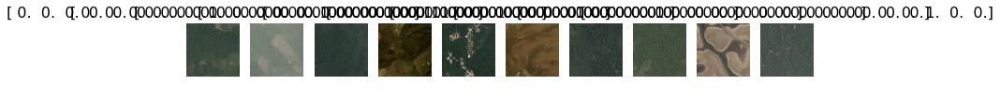

In [60]:
plots(imgs, titles=labels)

In [17]:
??vgg.finetune

In [25]:
vgg2 = Vgg16()

In [ ]:
#load previously trained weights

#vgg2.model.load_weights(results_path+ 'fullRun1_ft5.h5')

In [22]:
trn_batches = vgg2.get_batches(path+'train', batch_size=batch_size)
val_batches = vgg2.get_batches(path+'valid', batch_size=batch_size)

Found 1302 images belonging to 17 classes.
Found 1303 images belonging to 17 classes.


In [26]:
vgg2.finetune(trn_batches)

In [27]:
no_of_epochs = 2
latest_weights_filename = None
for epoch in range(no_of_epochs):
    print("Running epoch: " + str(epoch))
    vgg2.fit(trn_batches, val_batches, nb_epoch=1)
    latest_weights_filename = 'ft' + str(epoch) + '.h5'
    vgg2.model.save_weights(results_path+latest_weights_filename)
print("Completed " + str(no_of_epochs) + " fit operations")

Running epoch: 0
Epoch 1/1
1302/1302 [==============================] - 1199s - loss: 3.3190 - acc: 0.2366 - val_loss: 2.5201 - val_acc: 0.3239
Running epoch: 1
Epoch 1/1
1302/1302 [==============================] - 1200s - loss: 3.0094 - acc: 0.3095 - val_loss: 2.7653 - val_acc: 0.3047
Completed 2 fit operations


In [33]:
#trn_data = get_data(trn_batches)
#val_data = get_data(val_batches)

trn_data = get_data(path+'train')
save_array(path+'trn_data.bc', trn_data)

Found 1302 images belonging to 17 classes.


In [31]:
vgg2.model.summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
lambda_2 (Lambda)                (None, 3, 224, 224)   0           lambda_input_2[0][0]             
____________________________________________________________________________________________________
zeropadding2d_14 (ZeroPadding2D) (None, 3, 226, 226)   0           lambda_2[0][0]                   
____________________________________________________________________________________________________
convolution2d_14 (Convolution2D) (None, 64, 224, 224)  1792        zeropadding2d_14[0][0]           
____________________________________________________________________________________________________
zeropadding2d_15 (ZeroPadding2D) (None, 64, 226, 226)  0           convolution2d_14[0][0]           
___________________________________________________________________________________________